# Aliriza_HM_explanatory_model_analysis_fraud_detection

## Purpose

- Salah satu perusahaan yang bergerak di bidang asuransi mengalami kesulitan dalam mengatasi dan mengendalikan jumlah kasus fraud. Anda sebagai data scientist yang bekerja di salah satu konsultan manajemen ternama diminta untuk melakukan otomatisasi pada pendeteksian fraud.

1. Identifikasi berapa banyak nilai null yang terdapat di dalam dataset. Perhatian: nilai null pada dataset tidak selalu NA atau NULL (10 poin)
2. Lakukan treatment pada kolom yang bernilai NA atau NULL. Berikan alasan anda mengapa anda melakukan treatment tertentu pada nilai NA tersebut. (10 poin)
3. Lakukan analisis pada beberapa variabel prediktor dan interpretasikan analisisnya  dengan mengaitkan analisanya dengan variabel target. Pilihlah beberapa variabel yang akan digunakan untuk modeling berdasarkan hasil analisa. (20 poin)
4. Buatlah model machine learning dengan regresi logistik dan KNN sebagai baseline dari model, lalu random forest dan XgBoost sebagai model lanjutan. Lakukan hyperparameter tuning menggunakan metode grid dengan spesifikasi masing-masing model sebagai berikut:

    a. Regresi Logistik
       penalty: elasticnet, l2
       fit_intercept: True,False
       C: 0.25, 0.5, 0.75, 1.0
        
    b. KNN
       n_neighbors: 2 sampai 5
       p: 1 sampai 2
       Random Forest
       n_estimators: 10, 50, 100, 1000
       criterion: gini, entropy
       max_depth: 3,5,10, None
       max_features: sqrt, log2
       
    c. Random Forest
       n_estimators: 10, 50, 100, 1000
       criterion: gini, entropy
       max_depth: 3,5,10, None
       max_features: sqrt, log2

    d. XgBoost:
       n_estimators: 10, 50, 100
       max_depth: 3,5,10,None
       learning_rate: 0.1, 0.05, 0.01 
       grow_policy: 0, 1
       
Evaluasi model menggunakan metrik f1-score, precision, recall dan AUC. Gunakan metode G-means untuk mengatasi masalah imbalanced jika ada (30 poin)

5. Interpretasikan model terbaik (berdasarkan f1-score) yang diperoleh pada model poin 4 menggunakan feature importance dan partial dependence plot. Berikan rekomendasi terkait bagaimana cara mengidentifikasi nasabah yang melakukan fraud (20 poin)
6. Gunakan LIME untuk melaukan interpretasi lokal pada beberapa nomor polis berikut:
    a. 527945
    b. 235220
    c. 605100
    
Berikan interpretasinya (10 poin)

In [1]:
import six
import sys
sys.modules['sklearn.externals.six'] = six

In [2]:
# import pandas for data wrangling
import pandas as pd
# import numpy for vectorize data manipulation
import numpy as np
# import matplotlib.pyplot module for data visualization
import matplotlib.pyplot as plt

# import train and test split method from scikit-learn
from sklearn.model_selection import train_test_split
# import metrics method for model evaluation
import sklearn.metrics as metrics
# load logistic regression model
from sklearn.linear_model import LogisticRegression
# Lload k-nearest neighbors model
from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix, classification_report, precision_score,roc_auc_score, f1_score, recall_score,roc_curve
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from sklearn.model_selection import KFold
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
import dalex as dx
import shap
from lime.lime_tabular import LimeTabularExplainer 

# load statsmodel module 
import statsmodels.api as sm
import statsmodels.formula.api as smf

# load rulefit model
from skrules import SkopeRules

# load scikit-plot modules
import scikitplot as skplt

# load eli5
import eli5

from sklearn.preprocessing import StandardScaler
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from matplotlib import pyplot
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

from scipy.stats import skew

D:\anaconda\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


In [3]:
df = pd.read_csv('insuranceFraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,10/17/2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,6/27/2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,9/6/2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,5/25/1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,6/6/2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,7/16/1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,1/5/2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,2/17/2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,11/18/2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


### Data Information

- months_as_customer: lama user menjadi nasabah dalam hitungan bulan
- age: usia nasabah
- policy_number: nomor polis
- policy_bind_date: tanggal polis
- policy_state: wilayah polis, negara bagian
- policy_csl: Combined single limit polis
- policy_deductable: risiko yang ditanggung bersama
- policy_annual_premium: premi tahunan
- umbrella_limit: limit pembayaran risiko oleh perusahaan asuransi
- insured_zip: kode pos nasabah
- insured_sex: gender nasabah
- insured_education_level: tingkat pendidikan nasabah
- insured_occupation: pekerjaan nasabah
- insured_hobbies: hobi nasabah
- insured_relationship: status hubungan nasabah
- capital-gains: besar gains yang diperoleh dari ganti rugi
- capital-loss: besar loss yang diperoleh dari ganti rugi
- incident_date: tanggal insiden terjadi
- incident_type: tipe insiden
- collision_type: tipe tabrakan
- incident_severity: tingkah keparahan
- authorities_contacted: pihak berwajib yang dihubungi
- incident_state: lokasi insiden, negara bagian
- incident_city: kota terjadinya insiden
- incident_location: lokasi terjadinya insiden
- incident_hour_of_the_day: jam terjadinya insiden
- number_of_vehicles_involved: jumlah kendaraan yang ikut dalam insiden
- property_damage: apakah terdapat kerusakan properti? YES jika ya
- bodily_injuries: jumlah korban luka
- witness: jumlah saksi mata
- police_report_available: apakah terdapat laporan polisi? YES jika ya
- total_claim_amount: total klaim
- injury_claim: klaim untuk luka-luka
- property_claim: klaim untuk kerusakan properti
- vehicle_claim: klaim untuk kerusakan mobil
- auto_make: merek otomotif
- auto_model: model otomotif
- auto_year: tahun pembuatan mobil
- fraud_reported: apakah terlapor sebagai fraud? Y jika ya

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [5]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


## Data Cleaning

In [6]:
for i in df.columns:
    if df[i].dtype == 'object':
        print(i, ":", df[i].nunique())

policy_bind_date : 951
policy_state : 3
policy_csl : 3
insured_sex : 2
insured_education_level : 7
insured_occupation : 14
insured_hobbies : 20
insured_relationship : 6
incident_date : 60
incident_type : 4
collision_type : 4
incident_severity : 4
authorities_contacted : 5
incident_state : 7
incident_city : 7
incident_location : 1000
property_damage : 3
police_report_available : 3
auto_make : 14
auto_model : 39
fraud_reported : 2


In [7]:
df.duplicated().sum()

0

In [8]:
df.replace('?', np.nan, inplace = True)

In [9]:
df.isna().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

In [10]:
df['collision_type'] = df['collision_type'].fillna(df['collision_type'].mode()[0])
df['property_damage'] = df['property_damage'].fillna(df['property_damage'].mode()[0])
df['police_report_available'] = df['police_report_available'].fillna(df['police_report_available'].mode()[0])

In [11]:
df.isna().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [12]:
# merubah type dataset, agar dapat diproses
df['policy_bind_date'] = df['policy_bind_date'].astype('datetime64[ns]')
df['incident_date'] = df['incident_date'].astype('datetime64[ns]')
df['umbrella_limit'] = df['umbrella_limit'].astype('object')
df['policy_number'] = df['policy_number'].astype('object')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   object        
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   object        
 5   policy_csl                   1000 non-null   object        
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   object        
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   object        
 11  insured_education_level      1000 non-null  

In [14]:
# Drop features yang memiliki uniques value yang banyak dan feature yang dapat menyebabkan ML Bias
df.drop(['incident_location','policy_bind_date','incident_date','auto_model','insured_sex',
         'insured_hobbies','insured_relationship','insured_relationship','insured_education_level','insured_occupation'
        ,'auto_make','insured_zip'],
        axis=1,inplace=True)

In [15]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


## Outliers checking and data standardization

In [16]:
cat=[]
num=[]
for i in df.columns:
  if df[i].dtype=='object':
    cat.append(i)
  else:
    num.append(i)
print('cat = ',cat)
print('num = ',num)

cat =  ['policy_number', 'policy_state', 'policy_csl', 'umbrella_limit', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'fraud_reported']
num =  ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']


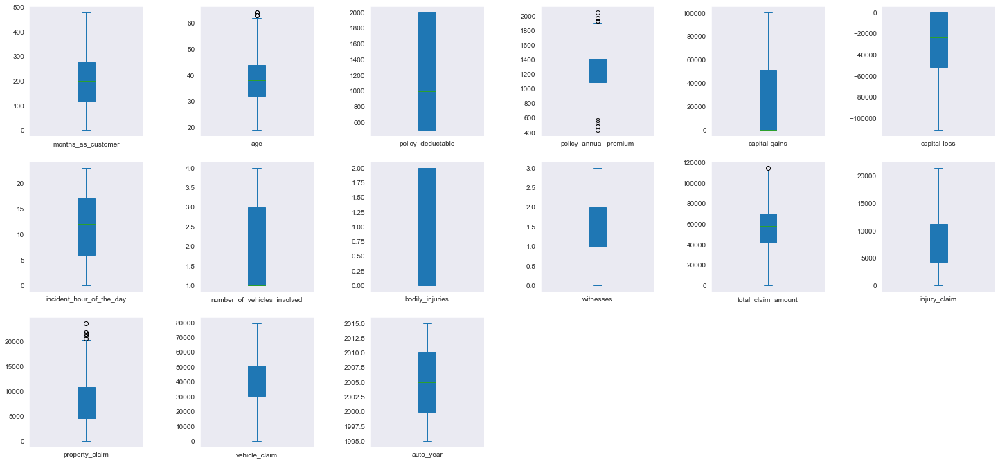

In [17]:
sns.set_style('dark')
df[num].plot(subplots=True, layout=(5,6), kind='box', figsize=(25,20), patch_artist=True)
plt.subplots_adjust(wspace=0.5);

In [18]:
def dist_plot(df, cols):
  sns.set_style('dark')
  plt.figure(figsize=(25,20))
  for i, col in enumerate(cols):
    ax = plt.subplot(5,6, i+1)
    sns.kdeplot(df[col], ax=ax)
    plt.text(0.5,0.9,"skew= " + str(round(skew(df[col]),2)), bbox=dict(facecolor='yellow', alpha=0.5), horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
    plt.xlabel(col)
  plt.show()

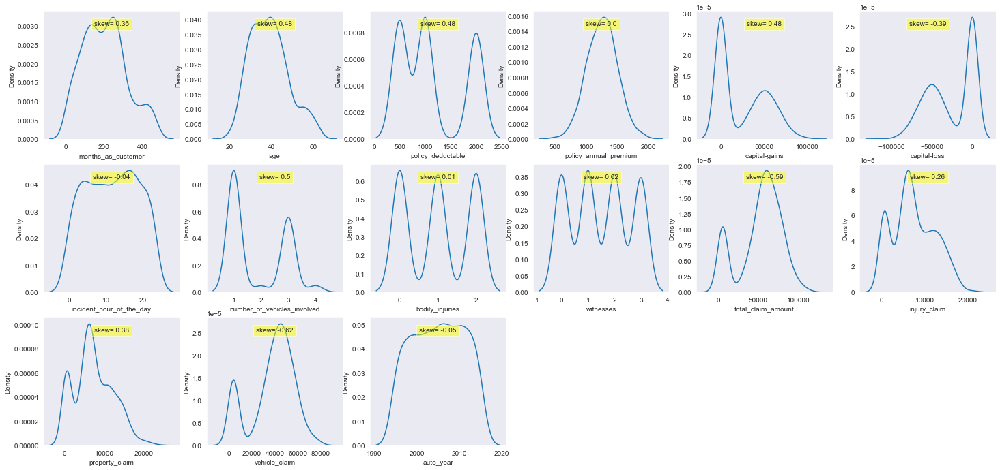

In [19]:
dist_plot(df, num)

In [20]:
def remove_outlier(col):
    sorted(col)
    Q1 = col.quantile(0.25)
    Q3 = col.quantile(0.75)
    IQR=Q3-Q1
    lower= Q1-(1.5 * IQR)
    upper= Q3+(1.5 * IQR)
    return lower, upper

for column in df.columns:
    if df[column].dtype != 'object': 
        lr,ur=remove_outlier(df[column])
        df[column]=np.where(df[column]>ur,ur,df[column])
        df[column]=np.where(df[column]<lr,lr,df[column])

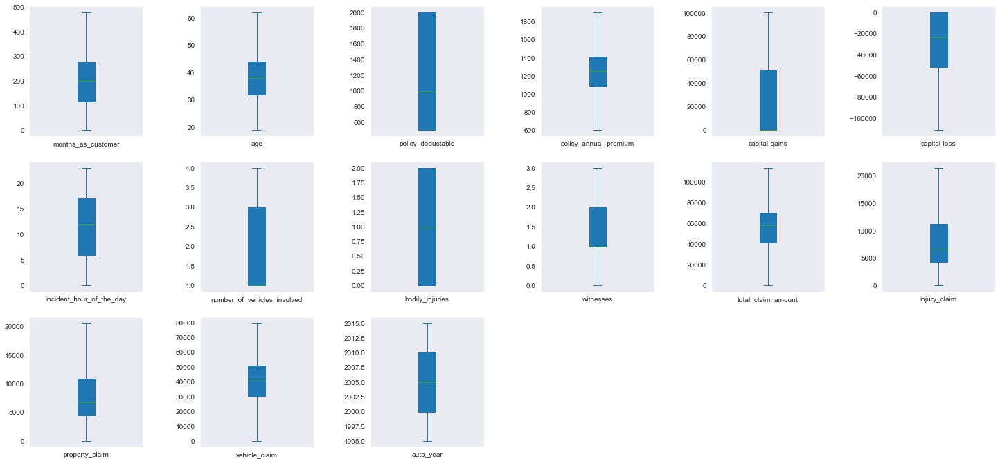

In [21]:
sns.set_style('dark')
df[num].plot(subplots=True, layout=(5,6), kind='box', figsize=(25,20), patch_artist=True)
plt.subplots_adjust(wspace=0.5);

In [22]:
df['umbrella_limit'] = df['umbrella_limit'].astype('int64')
df['policy_number'] = df['policy_number'].astype('int64')

In [23]:
df1 = pd.get_dummies(data=df, drop_first=True)

In [24]:
df1

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,...,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES,fraud_reported_Y
0,328.0,48.0,521585,1000.0,1406.91,0,53300.0,0.0,5.0,1.0,...,0,1,0,0,0,0,0,1,1,1
1,228.0,42.0,342868,2000.0,1197.22,5000000,0.0,0.0,8.0,1.0,...,0,0,0,0,0,1,0,0,0,1
2,134.0,29.0,687698,2000.0,1413.14,5000000,35100.0,0.0,7.0,3.0,...,0,1,0,0,0,0,0,0,0,0
3,256.0,41.0,227811,2000.0,1415.74,6000000,48900.0,-62400.0,5.0,1.0,...,0,0,0,0,0,0,0,0,0,1
4,228.0,44.0,367455,1000.0,1583.91,6000000,66000.0,-46000.0,20.0,1.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3.0,38.0,941851,1000.0,1310.80,0,0.0,0.0,20.0,1.0,...,0,0,0,0,1,0,0,1,0,0
996,285.0,41.0,186934,1000.0,1436.79,0,70900.0,0.0,23.0,1.0,...,0,0,0,1,0,0,0,1,0,0
997,130.0,34.0,918516,500.0,1383.49,3000000,35100.0,0.0,4.0,3.0,...,0,0,0,0,0,0,0,0,1,0
998,458.0,62.0,533940,2000.0,1356.92,5000000,0.0,0.0,2.0,1.0,...,0,0,0,0,0,0,0,0,1,0


## Feature Selection

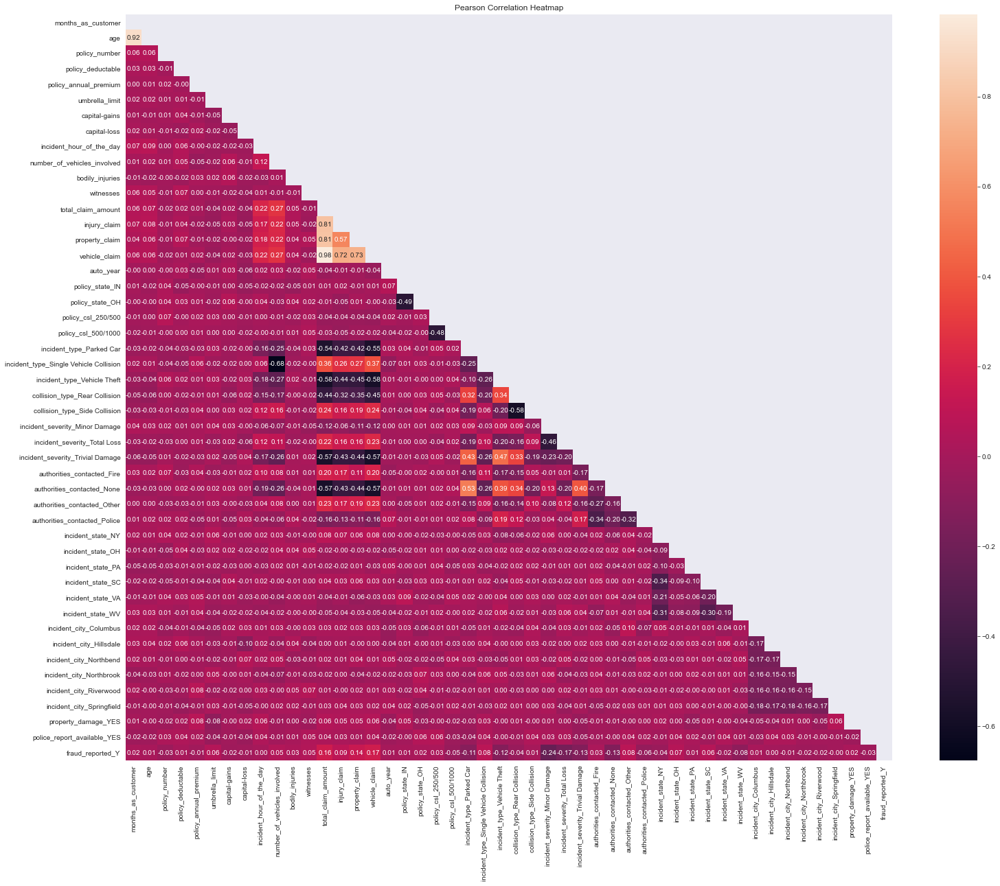

In [25]:
df_corr = df1.corr()
mask = np.zeros_like(df_corr)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize=(25, 20))
ax = sns.heatmap(df_corr,mask=mask, 
                 annot=True, annot_kws={'size':10}, fmt=".2f")
plt.title("Pearson Correlation Heatmap")
plt.show()

Findings:
- Thereshold 0.8
- Drop kolom age, total_claim_amount, injury_claim,property_claim

In [26]:
df.drop(['age','total_claim_amount','injury_claim','property_claim'],
        axis=1,inplace=True)

## Split the dataset

In [27]:
df['fraud_reported'] = df['fraud_reported'].str.replace('Y', '1')
df['fraud_reported'] = df['fraud_reported'].str.replace('N', '0')
df['fraud_reported'] = df['fraud_reported'].astype(int)

In [28]:
X = df.drop('fraud_reported',axis=1)
y = df['fraud_reported']

In [29]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size = 0.3,
    stratify = y,
    random_state = 1000
)

In [30]:
X_train.shape

(700, 23)

In [31]:
filter_logic_1 = (X_train['policy_number'] == 527945)
X_train[filter_logic_1]

,months_as_customer,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,...,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,auto_year


In [32]:
filter_logic_2 = (X_train['policy_number'] == 235220)
X_train[filter_logic_2]

,months_as_customer,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,...,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,auto_year
97,29.0,235220,IL,250/500,2000.0,1352.83,0,0.0,-71700.0,Multi-vehicle Collision,...,SC,Hillsdale,4.0,4.0,YES,1.0,2.0,YES,50470.0,2013.0


In [33]:
filter_logic_3 = (X_train['policy_number'] == 605100)
X_train[filter_logic_3]

,months_as_customer,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,...,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,auto_year
745,258.0,605100,IL,100/300,500.0,1042.25,0,0.0,-44400.0,Multi-vehicle Collision,...,NC,Riverwood,0.0,3.0,NO,2.0,3.0,NO,54160.0,2008.0


In [34]:
X_train.drop(['policy_number'],axis=1,inplace=True)

In [35]:
X_test.shape

(300, 23)

In [36]:
filter_logic_test1 = (X_test['policy_number'] == 527945)
X_test[filter_logic_test1]

,months_as_customer,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,...,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,auto_year
77,319.0,527945,IN,250/500,500.0,1307.11,0,0.0,0.0,Multi-vehicle Collision,...,WV,Northbrook,22.0,3.0,NO,0.0,2.0,NO,38010.0,2005.0


In [37]:
filter_logic_test2 = (X_test['policy_number'] == 235220)
X_test[filter_logic_test2]

,months_as_customer,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,...,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,auto_year


In [38]:
filter_logic_test3 = (X_test['policy_number'] == 605100)
X_test[filter_logic_test3]

,months_as_customer,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,...,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,auto_year


In [39]:
X_test.drop(['policy_number'],axis=1,inplace=True)

## EDA

In [40]:
eda_ytrain = pd.DataFrame(y_train)

In [41]:
X_train_eda = pd.concat([X_train, y_train.drop(axis=1, columns=num)],axis=1)
X_train_eda

,months_as_customer,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_type,collision_type,...,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,vehicle_claim,auto_year,fraud_reported
757,173.0,OH,250/500,1000.0,1274.63,0,51000.0,0.0,Single Vehicle Collision,Rear Collision,...,Springfield,22.0,1.0,YES,2.0,3.0,NO,33110.0,1995.0,0
246,2.0,IL,250/500,1000.0,1340.56,0,0.0,0.0,Single Vehicle Collision,Side Collision,...,Northbend,19.0,1.0,YES,0.0,2.0,YES,45220.0,2008.0,0
304,286.0,IN,250/500,500.0,1386.93,0,54100.0,-77600.0,Multi-vehicle Collision,Rear Collision,...,Springfield,15.0,3.0,YES,0.0,0.0,NO,46060.0,2001.0,0
665,435.0,OH,500/1000,500.0,1064.49,5000000,73500.0,-43300.0,Single Vehicle Collision,Front Collision,...,Arlington,23.0,1.0,NO,2.0,1.0,NO,47160.0,2007.0,1
160,216.0,IN,500/1000,1000.0,1152.40,0,39600.0,-82400.0,Parked Car,Rear Collision,...,Springfield,0.0,1.0,YES,2.0,3.0,NO,3920.0,2014.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,113.0,OH,250/500,2000.0,1091.73,0,36100.0,-42300.0,Multi-vehicle Collision,Rear Collision,...,Springfield,15.0,3.0,NO,0.0,2.0,YES,38850.0,2004.0,1
939,279.0,IN,250/500,2000.0,1333.97,6000000,61100.0,-30700.0,Multi-vehicle Collision,Rear Collision,...,Arlington,21.0,3.0,NO,1.0,0.0,NO,38850.0,2011.0,1
244,95.0,OH,250/500,1000.0,773.99,0,0.0,-70300.0,Vehicle Theft,Rear Collision,...,Springfield,3.0,1.0,YES,1.0,2.0,NO,2240.0,2014.0,0
979,229.0,IN,500/1000,1000.0,1331.94,0,0.0,-55400.0,Single Vehicle Collision,Rear Collision,...,Columbus,17.0,1.0,NO,0.0,2.0,YES,34720.0,2004.0,0


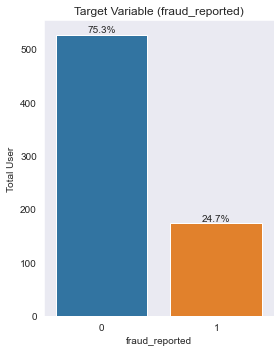

In [42]:
fig, ax = plt.subplots(figsize=(4,5))
ax = sns.countplot(x='fraud_reported', data=eda_ytrain)
plt.ylabel('Total User')
plt.title('Target Variable (fraud_reported)')
total_check = len(eda_ytrain)
for p in ax.patches:
      percentage = f'{100 * p.get_height() / total_check:.1f}%\n'
      x = p.get_x() + p.get_width() / 2
      y = p.get_height()
      ax.annotate(percentage, (x, y), ha='center', va='center')
plt.tight_layout()
plt.show()

Finding :
- Pada target variable, terlihat bahwa pelanggan yang meresponse capaign lebih sedikit dibanding dengan yang tidak meresponse campaign

In [43]:
cat_1=[]
num_1=[]
for i in X_train.columns:
  if X_train[i].dtype=='object':
    cat_1.append(i)
  else:
    num_1.append(i)
print('cat = ',cat_1)
print('num = ',num_1)

cat =  ['policy_state', 'policy_csl', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available']
num =  ['months_as_customer', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'vehicle_claim', 'auto_year']


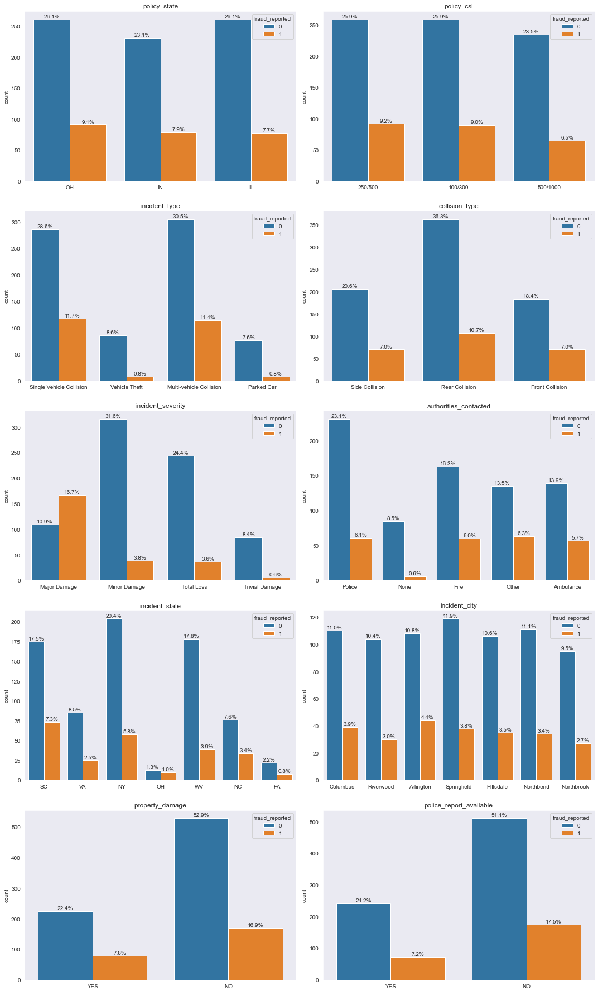

In [44]:
a = 1
plt.figure(figsize=[15,25])
df_n = df.loc[:,['policy_state', 'policy_csl', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 
                 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'fraud_reported']]
for i in df_n.iloc[:,:-1].columns:
    plt.subplot(5,2,a)
    a+=1
    ax = sns.countplot(x=i, hue='fraud_reported', data=df_n)
    plt.title(i)
    plt.xlabel(' ')
    total = len(df_n)
    for p in ax.patches:
      percentage = f'{100 * p.get_height() / total:.1f}%\n'
      x = p.get_x() + p.get_width() / 2
      y = p.get_height()
      ax.annotate(percentage, (x, y), ha='center', va='center')
plt.tight_layout()
plt.show()

Findings:
- Tidak terdapat pola yang begitu spesial dari tiap features terhadap fraud_reported
- Kemungkinan tertinggi fraud berada pada feature incident_servertiy pada value Major demage
- Ada kemungkinan bahwa feture incident_servertiy bisa menjadi salah satu dari feature importance pada Major, Minor damage atau trivial damage

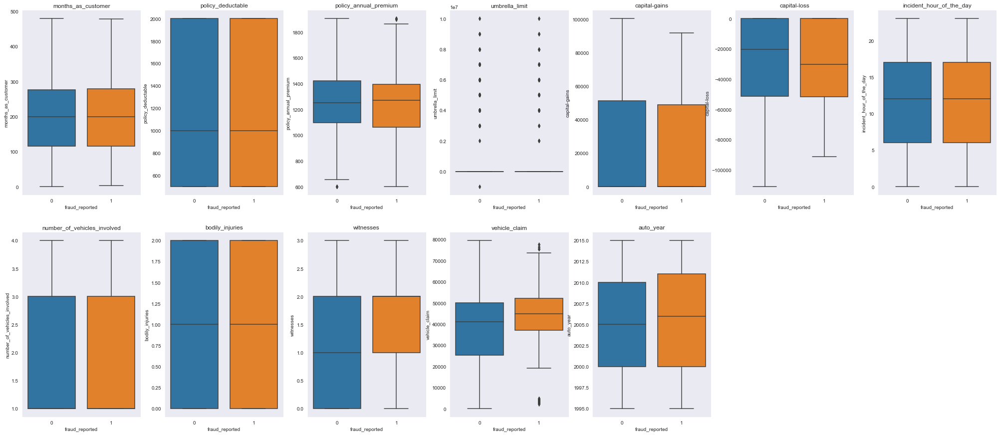

In [45]:
a = 1
df_n_check = df.loc[:,['months_as_customer', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 
                       'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 
                       'bodily_injuries', 'witnesses', 'vehicle_claim', 'auto_year','fraud_reported']]
boxplot_cek = df_n_check.iloc[:,:-1]
fig, axes = plt.subplots(5,3,figsize=(35,15))
for i in boxplot_cek:
    plt.subplot(2,7,a)
    a+=1
    ax = sns.boxplot(y=i, x='fraud_reported', data=df_n_check)
    plt.title(i)

Findings :
- Untuk feature vehicle _claim kemungkinan akan menjadi salah satu feature importance dimana, memiliki perbedaan rata2 yang lumayan signifikan
- Selain dari feature tersebut, tidak terdapat sebarang data yang spesial hampir semua feature memiliki sebaran yang mirip

## Data Prepossesing

In [46]:
scaler = StandardScaler()
X_train_scaler = pd.DataFrame(scaler.fit_transform(X_train[num_1].astype('int64')), columns=num_1, index=X_train.index)
X_train_scaler.head()

,months_as_customer,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,vehicle_claim,auto_year
757,-0.276903,-0.214455,0.065420,-0.492053,0.913976,0.951767,1.512472,-0.798012,1.213890,1.352442,-0.227212,-1.711578
246,-1.740209,-0.214455,0.338297,-0.492053,-0.901981,0.951767,1.080748,-0.798012,-1.224339,0.455937,0.409973,0.438824
304,0.690076,-1.030317,0.528484,-0.492053,1.024357,-1.828206,0.505117,1.182869,-1.224339,-1.337073,0.454171,-0.719085
665,1.965121,-1.030317,-0.802826,1.655309,1.715133,-0.599429,1.656380,-0.798012,1.213890,-0.440568,0.512049,0.273408
160,0.091062,-0.214455,-0.438990,-0.492053,0.508056,-2.000163,-1.653502,-0.798012,1.213890,1.352442,-1.763087,1.431317


In [47]:
X_test_scaler = pd.DataFrame(scaler.transform(X_test[num_1].astype('int64')), columns=num_1, index=X_test.index)
X_test_scaler.head()

,months_as_customer,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,vehicle_claim,auto_year
420,0.022604,-0.214455,-0.513411,-0.492053,-0.901981,0.951767,0.936841,-0.798012,1.213890,0.455937,0.583081,-1.546163
657,0.399127,-1.030317,0.222531,3.373199,-0.901981,-0.241185,0.505117,1.182869,-1.224339,1.352442,0.218449,0.769655
36,-1.226769,-0.214455,-1.117048,-0.492053,-0.901981,0.951767,-1.221778,-0.798012,-0.005225,-0.440568,0.564666,-0.222838
554,-0.011626,-1.030317,-0.009001,-0.492053,-0.901981,0.951767,-0.214423,1.182869,-0.005225,0.455937,-0.652879,1.265901
475,-0.507952,1.417269,-0.104095,-0.492053,0.326460,-1.219191,0.649025,1.182869,-0.005225,-0.440568,0.383665,1.596733


In [48]:
X_train = pd.concat([X_train_scaler, X_train.drop(axis=1, columns=num_1)],axis=1)
X_train

,months_as_customer,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,...,policy_state,policy_csl,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available
757,-0.276903,-0.214455,0.065420,-0.492053,0.913976,0.951767,1.512472,-0.798012,1.213890,1.352442,...,OH,250/500,Single Vehicle Collision,Rear Collision,Total Loss,Fire,SC,Springfield,YES,NO
246,-1.740209,-0.214455,0.338297,-0.492053,-0.901981,0.951767,1.080748,-0.798012,-1.224339,0.455937,...,IL,250/500,Single Vehicle Collision,Side Collision,Minor Damage,Fire,NY,Northbend,YES,YES
304,0.690076,-1.030317,0.528484,-0.492053,1.024357,-1.828206,0.505117,1.182869,-1.224339,-1.337073,...,IN,250/500,Multi-vehicle Collision,Rear Collision,Minor Damage,Other,NY,Springfield,YES,NO
665,1.965121,-1.030317,-0.802826,1.655309,1.715133,-0.599429,1.656380,-0.798012,1.213890,-0.440568,...,OH,500/1000,Single Vehicle Collision,Front Collision,Total Loss,Ambulance,WV,Arlington,NO,NO
160,0.091062,-0.214455,-0.438990,-0.492053,0.508056,-2.000163,-1.653502,-0.798012,1.213890,1.352442,...,IN,500/1000,Parked Car,Rear Collision,Minor Damage,Police,VA,Springfield,YES,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,-0.790344,1.417269,-0.691194,-0.492053,0.383431,-0.563605,0.505117,1.182869,-1.224339,0.455937,...,OH,250/500,Multi-vehicle Collision,Rear Collision,Minor Damage,Other,NY,Springfield,NO,YES
939,0.630175,1.417269,0.309355,2.084782,1.273606,-0.148042,1.368564,1.182869,-0.005225,-1.337073,...,IN,250/500,Multi-vehicle Collision,Rear Collision,Major Damage,Other,SC,Arlington,NO,NO
244,-0.944376,-0.214455,-2.005967,-0.492053,-0.901981,-1.566688,-1.221778,-0.798012,-0.005225,0.455937,...,OH,250/500,Vehicle Theft,Rear Collision,Trivial Damage,None,PA,Springfield,YES,NO
979,0.202308,-0.214455,0.301086,-0.492053,-0.901981,-1.032904,0.792933,-0.798012,-1.224339,0.455937,...,IN,500/1000,Single Vehicle Collision,Rear Collision,Total Loss,Other,NY,Columbus,NO,YES


In [49]:
X_test = pd.concat([X_test_scaler, X_test.drop(axis=1, columns=num_1)],axis=1)
X_test

,months_as_customer,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,...,policy_state,policy_csl,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available
420,0.022604,-0.214455,-0.513411,-0.492053,-0.901981,0.951767,0.936841,-0.798012,1.213890,0.455937,...,IN,100/300,Single Vehicle Collision,Rear Collision,Major Damage,Ambulance,SC,Northbend,NO,NO
657,0.399127,-1.030317,0.222531,3.373199,-0.901981,-0.241185,0.505117,1.182869,-1.224339,1.352442,...,IL,500/1000,Multi-vehicle Collision,Front Collision,Minor Damage,Other,NC,Riverwood,NO,NO
36,-1.226769,-0.214455,-1.117048,-0.492053,-0.901981,0.951767,-1.221778,-0.798012,-0.005225,-0.440568,...,IL,100/300,Single Vehicle Collision,Rear Collision,Total Loss,Police,NY,Northbrook,NO,YES
554,-0.011626,-1.030317,-0.009001,-0.492053,-0.901981,0.951767,-0.214423,1.182869,-0.005225,0.455937,...,IL,100/300,Multi-vehicle Collision,Side Collision,Minor Damage,Other,SC,Northbend,YES,YES
475,-0.507952,1.417269,-0.104095,-0.492053,0.326460,-1.219191,0.649025,1.182869,-0.005225,-0.440568,...,OH,500/1000,Multi-vehicle Collision,Side Collision,Total Loss,Police,NC,Hillsdale,NO,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,0.339225,-0.214455,-0.372838,-0.492053,1.558462,0.951767,1.656380,1.182869,-1.224339,1.352442,...,IL,500/1000,Multi-vehicle Collision,Side Collision,Total Loss,Other,OH,Springfield,NO,NO
79,0.185193,-1.030317,-1.166662,-0.492053,-0.901981,0.951767,0.649025,-0.798012,-0.005225,0.455937,...,OH,500/1000,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbrook,NO,NO
348,-1.628964,-0.214455,2.360069,-0.492053,1.116935,0.951767,1.368564,1.182869,-0.005225,-1.337073,...,IL,100/300,Multi-vehicle Collision,Side Collision,Total Loss,Other,SC,Arlington,YES,NO
194,-1.132638,1.417269,-0.277744,1.225837,0.141304,0.951767,-0.358331,1.182869,-1.224339,-0.440568,...,IL,250/500,Multi-vehicle Collision,Rear Collision,Total Loss,Other,VA,Northbrook,NO,YES


In [50]:
X_train = pd.get_dummies(data=X_train, drop_first=True)
X_train

,months_as_customer,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,...,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES
757,-0.276903,-0.214455,0.065420,-0.492053,0.913976,0.951767,1.512472,-0.798012,1.213890,1.352442,...,0,0,0,0,0,0,0,1,1,0
246,-1.740209,-0.214455,0.338297,-0.492053,-0.901981,0.951767,1.080748,-0.798012,-1.224339,0.455937,...,0,0,0,0,1,0,0,0,1,1
304,0.690076,-1.030317,0.528484,-0.492053,1.024357,-1.828206,0.505117,1.182869,-1.224339,-1.337073,...,0,0,0,0,0,0,0,1,1,0
665,1.965121,-1.030317,-0.802826,1.655309,1.715133,-0.599429,1.656380,-0.798012,1.213890,-0.440568,...,0,1,0,0,0,0,0,0,0,0
160,0.091062,-0.214455,-0.438990,-0.492053,0.508056,-2.000163,-1.653502,-0.798012,1.213890,1.352442,...,1,0,0,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,-0.790344,1.417269,-0.691194,-0.492053,0.383431,-0.563605,0.505117,1.182869,-1.224339,0.455937,...,0,0,0,0,0,0,0,1,0,1
939,0.630175,1.417269,0.309355,2.084782,1.273606,-0.148042,1.368564,1.182869,-0.005225,-1.337073,...,0,0,0,0,0,0,0,0,0,0
244,-0.944376,-0.214455,-2.005967,-0.492053,-0.901981,-1.566688,-1.221778,-0.798012,-0.005225,0.455937,...,0,0,0,0,0,0,0,1,1,0
979,0.202308,-0.214455,0.301086,-0.492053,-0.901981,-1.032904,0.792933,-0.798012,-1.224339,0.455937,...,0,0,1,0,0,0,0,0,0,1


In [51]:
X_test = pd.get_dummies(data=X_test, drop_first=True)
X_test

,months_as_customer,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,...,incident_state_VA,incident_state_WV,incident_city_Columbus,incident_city_Hillsdale,incident_city_Northbend,incident_city_Northbrook,incident_city_Riverwood,incident_city_Springfield,property_damage_YES,police_report_available_YES
420,0.022604,-0.214455,-0.513411,-0.492053,-0.901981,0.951767,0.936841,-0.798012,1.213890,0.455937,...,0,0,0,0,1,0,0,0,0,0
657,0.399127,-1.030317,0.222531,3.373199,-0.901981,-0.241185,0.505117,1.182869,-1.224339,1.352442,...,0,0,0,0,0,0,1,0,0,0
36,-1.226769,-0.214455,-1.117048,-0.492053,-0.901981,0.951767,-1.221778,-0.798012,-0.005225,-0.440568,...,0,0,0,0,0,1,0,0,0,1
554,-0.011626,-1.030317,-0.009001,-0.492053,-0.901981,0.951767,-0.214423,1.182869,-0.005225,0.455937,...,0,0,0,0,1,0,0,0,1,1
475,-0.507952,1.417269,-0.104095,-0.492053,0.326460,-1.219191,0.649025,1.182869,-0.005225,-0.440568,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,0.339225,-0.214455,-0.372838,-0.492053,1.558462,0.951767,1.656380,1.182869,-1.224339,1.352442,...,0,0,0,0,0,0,0,1,0,0
79,0.185193,-1.030317,-1.166662,-0.492053,-0.901981,0.951767,0.649025,-0.798012,-0.005225,0.455937,...,0,0,0,0,0,1,0,0,0,0
348,-1.628964,-0.214455,2.360069,-0.492053,1.116935,0.951767,1.368564,1.182869,-0.005225,-1.337073,...,0,0,0,0,0,0,0,0,1,0
194,-1.132638,1.417269,-0.277744,1.225837,0.141304,0.951767,-0.358331,1.182869,-1.224339,-0.440568,...,1,0,0,0,0,1,0,0,0,1


## Checking the overfitting data berfore modeling

In [52]:
early_stopping = callbacks.EarlyStopping(
    min_delta=0.001, 
    patience=20,
    restore_best_weights=True,
)

model = keras.Sequential([
    layers.Dense(512, activation='relu', input_shape=[42]),
    layers.Dense(512, activation='relu'),
    layers.Dense(512, activation='relu'),
    layers.Dense(1),
])
model.compile(
    optimizer='adam',
    loss='mae',
)

Minimum validation loss: 0.009666601195931435


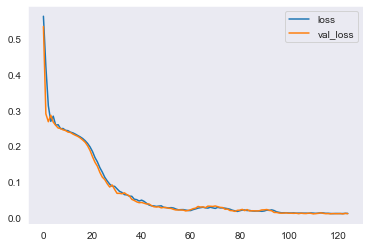

In [53]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_train, y_train),
    batch_size=256,
    epochs=500,
    callbacks=[early_stopping],
    verbose=0,
)

history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot();
print("Minimum validation loss: {}".format(history_df['val_loss'].min()))

## Modeling & Evaluation

### Logistic Regression

In [54]:
lr_model = LogisticRegression(C= 0.25, fit_intercept= False, penalty='l2',random_state=42)
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_test)
pred_proba_result_lr = lr_model.predict_proba(X_test)

In [55]:
metrics.f1_score(y_test, lr_preds)

0.47619047619047616

### Classification Report

In [56]:
pd.DataFrame(metrics.classification_report(y_test, lr_preds, target_names=['not fraud','fraud'], output_dict=True))

,not fraud,fraud,accuracy,macro avg,weighted avg
precision,0.822581,0.576923,0.78,0.699752,0.761985
recall,0.902655,0.405405,0.78,0.654030,0.780000
f1-score,0.860759,0.476190,0.78,0.668475,0.765899
support,226.000000,74.000000,0.78,300.000000,300.000000


### Confusion Matrix

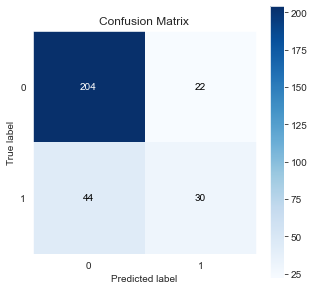

In [57]:
skplt.metrics.plot_confusion_matrix(y_test, lr_preds, figsize=(5,5));

### Hyperparameter tunning

In [58]:
param_grid = { 
    'penalty': ['elasticnet', 'l2'],
    'C': [0.25, 0.5, 0.75, 1.0],
    'fit_intercept' : [True,False],
}

In [59]:
lr_tun = GridSearchCV(estimator=lr_model, param_grid=param_grid, cv= 5)
lr_tun.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=LogisticRegression(C=0.25, fit_intercept=False,
                                          random_state=42),
             param_grid={'C': [0.25, 0.5, 0.75, 1.0],
                         'fit_intercept': [True, False],
                         'penalty': ['elasticnet', 'l2']})

In [60]:
lr_tun.best_params_

{'C': 0.5, 'fit_intercept': True, 'penalty': 'l2'}

### ROC & G-means

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

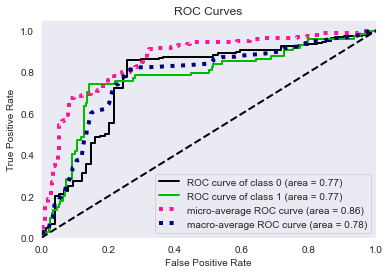

In [61]:
skplt.metrics.plot_roc(y_test, pred_proba_result_lr)

In [62]:
# find fpr and tpr using roc_curve() method
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_proba_result_lr[:,1])
gmeans_lr = np.sqrt(tpr * (1-fpr))
gmeans_lr

array([0.        , 0.11624764, 0.11547351, 0.1633042 , 0.16257024,
       0.19910707, 0.19865609, 0.30345219, 0.30276174, 0.34329955,
       0.34251486, 0.36104237, 0.35854952, 0.37604991, 0.37517436,
       0.39185684, 0.39094021, 0.40690347, 0.40498862, 0.43502757,
       0.43399547, 0.46202346, 0.46092209, 0.51228626, 0.50736032,
       0.60641157, 0.60344621, 0.61342121, 0.61190845, 0.65018901,
       0.64534282, 0.65449707, 0.65119984, 0.74406686, 0.74217596,
       0.7500299 , 0.74811411, 0.77866185, 0.77666272, 0.79875232,
       0.76079491, 0.76768007, 0.74104718, 0.74763439, 0.74535154,
       0.75186128, 0.6584138 , 0.66406552, 0.63138629, 0.63671454,
       0.63105474, 0.6362918 , 0.63341914, 0.63858999, 0.6209297 ,
       0.62591717, 0.55238605, 0.55675281, 0.52125362, 0.52531013,
       0.49088803, 0.49838294, 0.47365414, 0.47717578, 0.45537529,
       0.45871142, 0.44501545, 0.4482286 , 0.43879115, 0.44191425,
       0.25235082, 0.25412173, 0.21761685, 0.21912286, 0.17479

In [63]:
ix_lr = np.argmax(gmeans_lr)

In [64]:
print('Best Threshold={}, G-Mean={}'.format(thresholds[ix_lr], gmeans_lr[ix_lr]))

Best Threshold=0.36202159833682285, G-Mean=0.7987523157394081


In [65]:
new_pred_result_lr = (pred_proba_result_lr[:,1] >= thresholds[ix_lr]).astype(int)

In [66]:
metrics.f1_score(y_test, new_pred_result_lr)

0.6832298136645962

In [67]:
# check classification report result of new prediction result
pd.DataFrame(metrics.classification_report(y_test, new_pred_result_lr, target_names=['not fraud','fraud'], output_dict=True))

,not fraud,fraud,accuracy,macro avg,weighted avg
precision,0.910798,0.632184,0.83,0.771491,0.842073
recall,0.858407,0.743243,0.83,0.800825,0.830000
f1-score,0.883827,0.683230,0.83,0.783528,0.834346
support,226.000000,74.000000,0.83,300.000000,300.000000


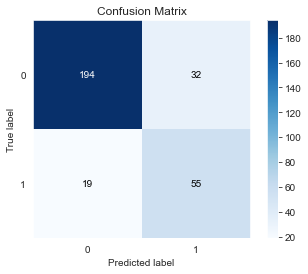

In [68]:
skplt.metrics.plot_confusion_matrix(y_test, new_pred_result_lr);

## KNN

In [69]:
knn_clf = KNeighborsClassifier(n_neighbors= 4, p= 1)
knn_clf.fit(X_train, y_train)
knn_clf_preds = knn_clf.predict(X_test)
pred_proba_result_knn = knn_clf.predict_proba(X_test)

In [70]:
metrics.f1_score(y_test, knn_clf_preds)

0.17582417582417584

### Classification Report

In [71]:
pd.DataFrame(metrics.classification_report(y_test, knn_clf_preds, target_names=['not fraud','fraud'], output_dict=True))

,not fraud,fraud,accuracy,macro avg,weighted avg
precision,0.766784,0.470588,0.75,0.618686,0.693723
recall,0.960177,0.108108,0.75,0.534143,0.750000
f1-score,0.852652,0.175824,0.75,0.514238,0.685701
support,226.000000,74.000000,0.75,300.000000,300.000000


### Confusion Matrix

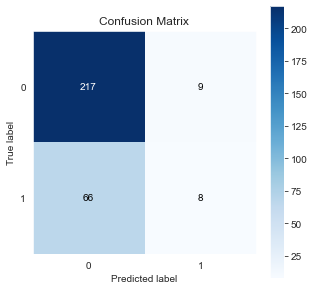

In [72]:
skplt.metrics.plot_confusion_matrix(y_test, knn_clf_preds, figsize=(5,5));

### Hyperparameter tunning

In [73]:
param_grid = { 
    'n_neighbors': [2,3,4,5],
    'p': [1,2]
}

In [74]:
knn_tun = GridSearchCV(estimator=knn_clf, param_grid=param_grid, cv= 5)
knn_tun.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=4, p=1),
             param_grid={'n_neighbors': [2, 3, 4, 5], 'p': [1, 2]})

In [75]:
knn_tun.best_params_

{'n_neighbors': 4, 'p': 1}

### ROC & G-means

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

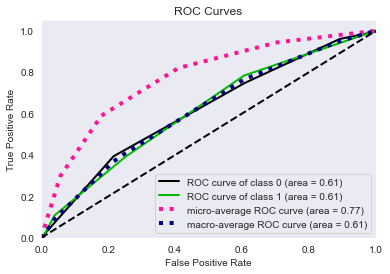

In [76]:
skplt.metrics.plot_roc(y_test, pred_proba_result_knn)

In [77]:
# find fpr and tpr using roc_curve() method
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_proba_result_knn[:,1])
gmeans_knn = np.sqrt(tpr * (1-fpr))
gmeans_knn

array([0.        , 0.        , 0.3221846 , 0.54134268, 0.55557017,
       0.        ])

In [78]:
ix_knn = np.argmax(gmeans_knn)

In [79]:
print('Best Threshold={}, G-Mean={}'.format(thresholds[ix_knn], gmeans_knn[ix_knn]))

Best Threshold=0.25, G-Mean=0.5555701717495836


In [80]:
new_pred_result_knn = (pred_proba_result_knn[:,1] >= thresholds[ix_knn]).astype(int)

In [81]:
metrics.f1_score(y_test, new_pred_result_knn)

0.4312267657992565

In [82]:
pd.DataFrame(metrics.classification_report(y_test, new_pred_result_knn, target_names=['not fraud','fraud'], output_dict=True))

,not fraud,fraud,accuracy,macro avg,weighted avg
precision,0.847619,0.297436,0.49,0.572527,0.711907
recall,0.393805,0.783784,0.49,0.588795,0.490000
f1-score,0.537764,0.431227,0.49,0.484496,0.511485
support,226.000000,74.000000,0.49,300.000000,300.000000


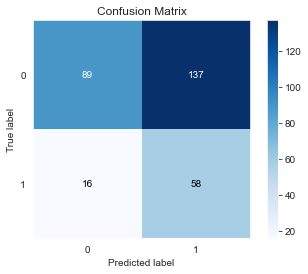

In [83]:
skplt.metrics.plot_confusion_matrix(y_test, new_pred_result_knn);

### Random Forest

In [84]:
rf_model = RandomForestClassifier(criterion = 'gini',max_depth= 10, max_features= 'log2', n_estimators= 50, random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)
pred_proba_result_rf = rf_model.predict_proba(X_test)

In [85]:
metrics.f1_score(y_test, rf_preds)

0.2828282828282828

In [86]:
pd.DataFrame(metrics.classification_report(y_test, rf_preds, target_names=['not fraud','fraud'], output_dict=True))

,not fraud,fraud,accuracy,macro avg,weighted avg
precision,0.781818,0.560000,0.763333,0.670909,0.727103
recall,0.951327,0.189189,0.763333,0.570258,0.763333
f1-score,0.858283,0.282828,0.763333,0.570556,0.716338
support,226.000000,74.000000,0.763333,300.000000,300.000000


### Confusion Matrix

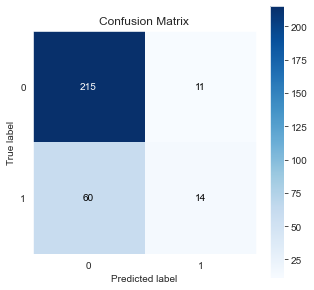

In [87]:
skplt.metrics.plot_confusion_matrix(y_test, rf_preds, figsize=(5,5));

### Hyperparameter tunning

In [88]:
param_grid = { 
    'n_estimators': [10, 50, 100, 1000],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [3,5,10, None],
    'criterion' :['gini', 'entropy']
}

In [89]:
CV_rfc = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv= 5)
CV_rfc.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=RandomForestClassifier(max_depth=10, max_features='log2',
                                              n_estimators=50,
                                              random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 10, None],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [10, 50, 100, 1000]})

In [90]:
CV_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'n_estimators': 100}

### ROC & G-means

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

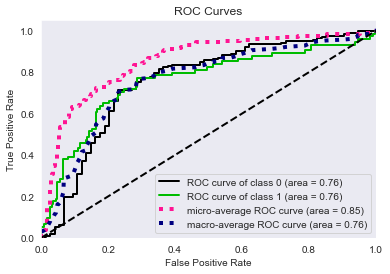

In [91]:
skplt.metrics.plot_roc(y_test, pred_proba_result_rf)

In [92]:
# find fpr and tpr using roc_curve() method
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_proba_result_rf[:,1])
gmeans_rf = np.sqrt(tpr * (1-fpr))
gmeans_rf

array([0.        , 0.11624764, 0.23249528, 0.23146425, 0.2587849 ,
       0.25820661, 0.28285117, 0.28221626, 0.3048284 , 0.30345219,
       0.38039746, 0.37953193, 0.39640817, 0.3955021 , 0.41165163,
       0.40975897, 0.42522698, 0.42424152, 0.5070656 , 0.50470164,
       0.51716529, 0.51473156, 0.59436081, 0.59012037, 0.60056579,
       0.59476308, 0.61493024, 0.61039195, 0.62015884, 0.61861423,
       0.63765296, 0.63124422, 0.64045995, 0.63882404, 0.64788582,
       0.64622244, 0.66393044, 0.66049926, 0.6691336 , 0.66388541,
       0.71312733, 0.71123825, 0.71909747, 0.71526226, 0.72299505,
       0.71909747, 0.72670718, 0.71876479, 0.72621332, 0.71605599,
       0.72332579, 0.72125618, 0.72843303, 0.72633682, 0.7334232 ,
       0.72703623, 0.73399367, 0.71651513, 0.72324311, 0.72100743,
       0.74076471, 0.71262406, 0.71884797, 0.69180462, 0.69774297,
       0.65604834, 0.66158471, 0.63952566, 0.64483301, 0.63341914,
       0.63858999, 0.6209297 , 0.62591717, 0.59189091, 0.59656

In [93]:
ix_rf = np.argmax(gmeans_rf)

In [94]:
print('Best Threshold={}, G-Mean={}'.format(thresholds[ix_rf], gmeans_rf[ix_rf]))

Best Threshold=0.2731111729665157, G-Mean=0.7407647134409572


In [95]:
new_pred_result_rf = (pred_proba_result_rf[:,1] >= thresholds[ix_rf]).astype(int)

In [96]:
metrics.f1_score(y_test, new_pred_result_rf)

0.5816326530612245

In [97]:
pd.DataFrame(metrics.classification_report(y_test, new_pred_result_rf, target_names=['not fraud','fraud'], output_dict=True))

,not fraud,fraud,accuracy,macro avg,weighted avg
precision,0.904494,0.467213,0.726667,0.685854,0.796632
recall,0.712389,0.770270,0.726667,0.741330,0.726667
f1-score,0.797030,0.581633,0.726667,0.689331,0.743898
support,226.000000,74.000000,0.726667,300.000000,300.000000


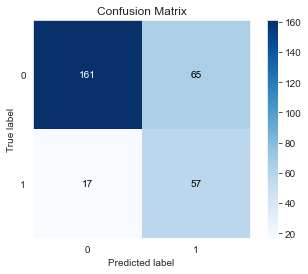

In [98]:
skplt.metrics.plot_confusion_matrix(y_test, new_pred_result_rf);

### XGBoost

In [99]:
xg_model = XGBClassifier(grow_policy = 'depthwise', learning_rate =  0.01, max_depth = 3, n_estimators = 50, random_state=42)
xg_model.fit(X_train, y_train)
xg_preds = xg_model.predict(X_test)
pred_proba_result_xg = xg_model.predict_proba(X_test)

[19:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [100]:
metrics.f1_score(y_test, xg_preds)

0.6506024096385542

### Classification Report

In [101]:
pd.DataFrame(metrics.classification_report(y_test, xg_preds, target_names=['not fraud','fraud'], output_dict=True))

,not fraud,fraud,accuracy,macro avg,weighted avg
precision,0.903846,0.586957,0.806667,0.745401,0.825680
recall,0.831858,0.729730,0.806667,0.780794,0.806667
f1-score,0.866359,0.650602,0.806667,0.758481,0.813139
support,226.000000,74.000000,0.806667,300.000000,300.000000


### Confusion Matrix

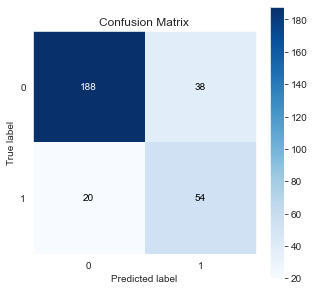

In [102]:
skplt.metrics.plot_confusion_matrix(y_test, xg_preds, figsize=(5,5));

### Hyperparameter tunning

In [103]:
param_grid = { 
    'n_estimators': [10, 50, 100],
    'learning_rate': [0.1, 0.05, 0.01],
    'max_depth' : [3,5,10, 'None'],
    'grow_policy' :['depthwise', 'lossguide']
}

In [104]:
XG_tun = GridSearchCV(estimator=xg_model, param_grid=param_grid, cv= 5)
XG_tun.fit(X_train, y_train)

[19:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[19:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1,
                                     enable_categorical=False, gamma=0,
                                     gpu_id=-1, grow_policy='depthwise',
                                     importance_type=None,
                                     interaction_constraints='',
                                     learning_rate=0.01, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=nan, monotone_constraints='()',
                                     n_estimators=50, n_jobs=8,
                                     num_parallel_tree=1, predictor='auto',
                                     random_state=42, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, subsam

In [105]:
XG_tun.best_params_

{'grow_policy': 'depthwise',
 'learning_rate': 0.01,
 'max_depth': 3,
 'n_estimators': 50}

### ROC & G-means

<AxesSubplot:title={'center':'ROC Curves'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

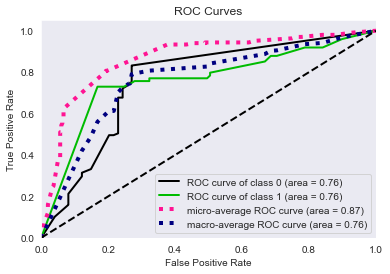

In [106]:
skplt.metrics.plot_roc(y_test, pred_proba_result_xg)

In [107]:
# find fpr and tpr using roc_curve() method
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_proba_result_xg[:,1])
gmeans_xg = np.sqrt(tpr * (1-fpr))
gmeans_xg

array([0.        , 0.77912246, 0.77704756, 0.77288106, 0.76658884,
       0.75811799, 0.75598544, 0.74955141, 0.74088578, 0.74108752,
       0.73886537, 0.73878443, 0.73423802, 0.71576367, 0.72212614,
       0.71739083, 0.71262406, 0.68082705, 0.67327605, 0.66563941,
       0.65009704, 0.63952566, 0.63148099, 0.62877656, 0.6233325 ,
       0.62323657, 0.62858634, 0.53153373, 0.52531013, 0.52159764,
       0.51409225, 0.51029816, 0.44177893, 0.38786915, 0.38259177,
       0.31248057, 0.        ])

In [108]:
ix_xg = np.argmax(gmeans_xg)

In [109]:
print('Best Threshold={}, G-Mean={}'.format(thresholds[ix_xg], gmeans_xg[ix_xg]))

Best Threshold=0.5443301200866699, G-Mean=0.7791224618579762


In [110]:
new_pred_result_xg = (pred_proba_result_xg[:,1] >= thresholds[ix_xg]).astype(int)

In [111]:
metrics.f1_score(y_test, new_pred_result_xg)

0.6506024096385542

In [112]:
pd.DataFrame(metrics.classification_report(y_test, new_pred_result_xg, target_names=['not fraud','fraud'], output_dict=True))

,not fraud,fraud,accuracy,macro avg,weighted avg
precision,0.903846,0.586957,0.806667,0.745401,0.825680
recall,0.831858,0.729730,0.806667,0.780794,0.806667
f1-score,0.866359,0.650602,0.806667,0.758481,0.813139
support,226.000000,74.000000,0.806667,300.000000,300.000000


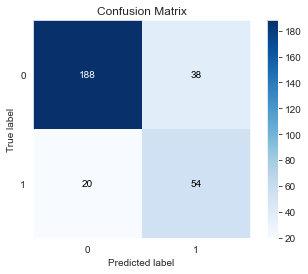

In [113]:
skplt.metrics.plot_confusion_matrix(y_test, new_pred_result_xg);

### ROC AUC Curve

### Train

In [114]:
model_lr = LogisticRegression(C= 0.25, fit_intercept= False, penalty='l2',random_state=42).fit(X_train, y_train)
probs_lr = model_lr.predict_proba(X_train)[:, 1]

model_knn = KNeighborsClassifier(n_neighbors= 4, p= 1).fit(X_train, y_train)
probs_knn = model_knn.predict_proba(X_train)[:, 1]

model_rf = RandomForestClassifier(criterion = 'gini',max_depth= 10, max_features= 'log2', 
                                  n_estimators= 50, random_state=42).fit(X_train, y_train)
probs_rf = model_rf.predict_proba(X_train)[:, 1]

model_xg = XGBClassifier(grow_policy = 'depthwise', learning_rate =  0.01, max_depth = 3, 
                         n_estimators = 50, random_state=42).fit(X_train, y_train)
probs_xg = model_xg.predict_proba(X_train)[:, 1]

[19:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [115]:
y_train_res = pd.Series(y_train)

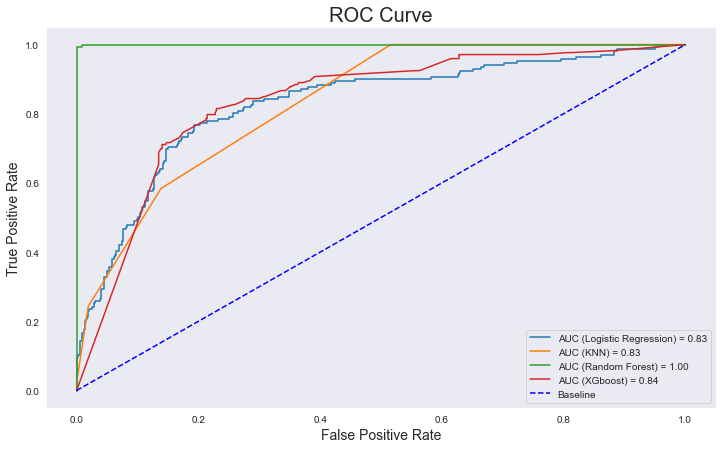

In [116]:
from sklearn.metrics import roc_auc_score, roc_curve

y_test_int = y_train.replace({'Good': 1, 'Bad': 0})
auc_lr = roc_auc_score(y_test_int, probs_lr)
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test_int, probs_lr)

auc_knn = roc_auc_score(y_test_int, probs_knn)
fpr_knn, tpr_knn, thresholds_dt = roc_curve(y_test_int, probs_knn)

auc_rf = roc_auc_score(y_test_int, probs_rf)
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test_int, probs_rf)

auc_xg = roc_auc_score(y_test_int, probs_xg)
fpr_xg, tpr_xg, thresholds_xg = roc_curve(y_test_int, probs_xg)

plt.figure(figsize=(12, 7))
plt.plot(fpr_lr, tpr_lr, label=f'AUC (Logistic Regression) = {auc_lr:.2f}')
plt.plot(fpr_knn, tpr_knn, label=f'AUC (KNN) = {auc_knn:.2f}')
plt.plot(fpr_rf, tpr_rf, label=f'AUC (Random Forest) = {auc_rf:.2f}')
plt.plot(fpr_xg, tpr_xg, label=f'AUC (XGboost) = {auc_xg:.2f}')
plt.plot([0, 1], [0, 1], color='blue', linestyle='--', label='Baseline')
plt.title('ROC Curve', size=20)
plt.xlabel('False Positive Rate', size=14)
plt.ylabel('True Positive Rate', size=14)
plt.legend();

### Test

In [117]:
model_lr = LogisticRegression(C= 0.25, fit_intercept= False, penalty='l2',random_state=42).fit(X_train, y_train)
probs_lr = model_lr.predict_proba(X_test)[:, 1]

model_knn = KNeighborsClassifier(n_neighbors= 4, p= 1).fit(X_train, y_train)
probs_knn = model_knn.predict_proba(X_test)[:, 1]

model_rf = RandomForestClassifier(criterion = 'gini',max_depth= 10, max_features= 'log2', 
                                  n_estimators= 50, random_state=42).fit(X_train, y_train)
probs_rf = model_rf.predict_proba(X_test)[:, 1]

model_xg = XGBClassifier(grow_policy = 'depthwise', learning_rate =  0.01, max_depth = 3, 
                         n_estimators = 50, random_state=42).fit(X_train, y_train)
probs_xg = model_xg.predict_proba(X_test)[:, 1]

[19:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


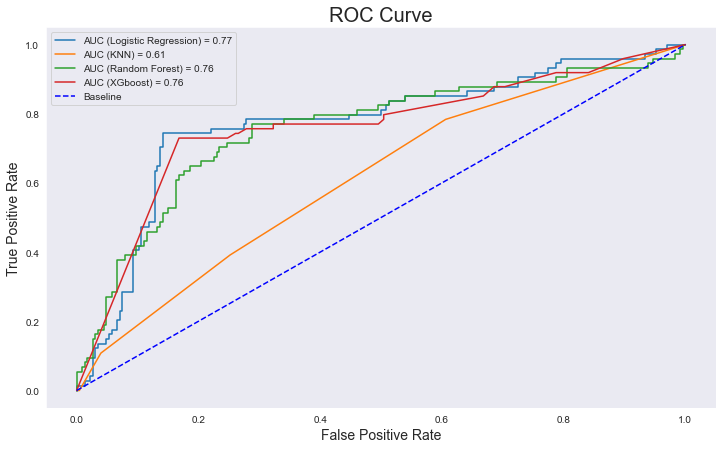

In [118]:
from sklearn.metrics import roc_auc_score, roc_curve

y_test_int = y_test.replace({'Good': 1, 'Bad': 0})
auc_lr = roc_auc_score(y_test_int, probs_lr)
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test_int, probs_lr)

auc_knn = roc_auc_score(y_test_int, probs_knn)
fpr_knn, tpr_knn, thresholds_dt = roc_curve(y_test_int, probs_knn)

auc_rf = roc_auc_score(y_test_int, probs_rf)
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test_int, probs_rf)

auc_xg = roc_auc_score(y_test_int, probs_xg)
fpr_xg, tpr_xg, thresholds_xg = roc_curve(y_test_int, probs_xg)

plt.figure(figsize=(12, 7))
plt.plot(fpr_lr, tpr_lr, label=f'AUC (Logistic Regression) = {auc_lr:.2f}')
plt.plot(fpr_knn, tpr_knn, label=f'AUC (KNN) = {auc_knn:.2f}')
plt.plot(fpr_rf, tpr_rf, label=f'AUC (Random Forest) = {auc_rf:.2f}')
plt.plot(fpr_xg, tpr_xg, label=f'AUC (XGboost) = {auc_xg:.2f}')
plt.plot([0, 1], [0, 1], color='blue', linestyle='--', label='Baseline')
plt.title('ROC Curve', size=20)
plt.xlabel('False Positive Rate', size=14)
plt.ylabel('True Positive Rate', size=14)
plt.legend();

### Model conclusion

Findings:
- Model terbaik merupakan logistic regression dimana, memiliki nilai F1 Score tertinggi 
- Perbandingan nilai F1 Score data fraud dan not fraud juga tidak begitu jauh, namun perlu adanya peningkatan data sisi feature selection agar dapat meningkatkan nilai F1 Score
- Hal yang membingungkan terjadi dimana, ketika melakukan G-Means pada XgBoost tidak terdapat perubahan sama sekali dari nilai F1 skore

## Feature Importance 

In [123]:
churn_lr_exp = dx.Explainer(lr_model, X_train, y_train, label = "Logistic Regression")

Preparation of a new explainer is initiated

  -> data              : 700 rows 42 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 700 values
  -> model_class       : sklearn.linear_model._logistic.LogisticRegression (default)
  -> label             : Logistic Regression
  -> predict function  : <function yhat_proba_default at 0x000001A6B2E71310> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.02, mean = 0.249, max = 0.811
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.67, mean = -0.00213, max = 0.952
  -> model_info        : package sklearn

A new explainer has been created!


In [124]:
churn_lr_exp.model_parts().plot()

Findings :
- Sesuai dengan hasil EDA untuk feature incident_serverity memiliki kemungkinan menjadi feature importance yang tinggi
- vehicle_claim juga sesuai dengan EDA dimana fetaure tersebut bisa menjadi salah satu feature importance

In [126]:
churn_lr_exp.model_profile().plot()

Calculating ceteris paribus: 100%|█████████████████████████████████████████████████████| 42/42 [00:00<00:00, 48.40it/s]


Findings:
- Semakin tinggi umbrella limit makin tinggi kemungkinan user fraud
- Semakin tinggi inside state OH makin tinggi kemungkinan user fraud (wilayah insiden)
- Semakin rendah incident_severity semakin kecil kemungkinan user melakukan fraud 
- Semakin tinggi vechicle claim makin tinggi kemungkinan user fraud

In [147]:
lr_explainer = shap.LinearExplainer(lr_model, X_train)
lr_shap_values = explainer.shap_values(X_train)

In [148]:
# initiate javascript module
shap.initjs()

# explain prediction for the first row of X_train
shap.force_plot(lr_explainer.expected_value, lr_shap_values[:1000,:], X_train.iloc[:1000,:])

In [128]:
lime_explainer = LimeTabularExplainer(
    X_train.values,
    feature_names = X_train.columns.tolist(),
    class_names = ['fraud', 'not fraud'],
    discretize_continuous = True,
    verbose = True
)

In [129]:
# user_id_527945 ada didata test
user_id_527945_cek = X_test[filter_logic_test1]
user_id_527945 = user_id_527945_cek.iloc[0]
user_id_527945

months_as_customer                        0.972469
policy_deductable                        -1.030317
policy_annual_premium                     0.201858
umbrella_limit                           -0.492053
capital-gains                            -0.901981
capital-loss                              0.951767
incident_hour_of_the_day                  1.512472
number_of_vehicles_involved               1.182869
bodily_injuries                          -1.224339
witnesses                                 0.455937
vehicle_claim                             0.030608
auto_year                                -0.057423
policy_state_IN                           1.000000
policy_state_OH                           0.000000
policy_csl_250/500                        1.000000
policy_csl_500/1000                       0.000000
incident_type_Parked Car                  0.000000
incident_type_Single Vehicle Collision    0.000000
incident_type_Vehicle Theft               0.000000
collision_type_Rear Collision  

In [130]:
user_id_235220_cek = X_train[filter_logic_2]
user_id_235220 = user_id_235220_cek.iloc[0]
user_id_235220

months_as_customer                       -1.509161
policy_deductable                         1.417269
policy_annual_premium                     0.387911
umbrella_limit                           -0.492053
capital-gains                            -0.901981
capital-loss                             -1.616842
incident_hour_of_the_day                 -1.077870
number_of_vehicles_involved               2.173310
bodily_injuries                          -0.005225
witnesses                                 0.455937
vehicle_claim                             0.686210
auto_year                                 1.265901
policy_state_IN                           0.000000
policy_state_OH                           0.000000
policy_csl_250/500                        1.000000
policy_csl_500/1000                       0.000000
incident_type_Parked Car                  0.000000
incident_type_Single Vehicle Collision    0.000000
incident_type_Vehicle Theft               0.000000
collision_type_Rear Collision  

In [132]:
user_id_605100_cek = X_train[filter_logic_3]
user_id_605100 = user_id_605100_cek.iloc[0]
user_id_605100

months_as_customer                        0.450471
policy_deductable                        -1.030317
policy_annual_premium                    -0.893785
umbrella_limit                           -0.492053
capital-gains                            -0.901981
capital-loss                             -0.638836
incident_hour_of_the_day                 -1.653502
number_of_vehicles_involved               1.182869
bodily_injuries                           1.213890
witnesses                                 1.352442
vehicle_claim                             0.880364
auto_year                                 0.438824
policy_state_IN                           0.000000
policy_state_OH                           0.000000
policy_csl_250/500                        0.000000
policy_csl_500/1000                       0.000000
incident_type_Parked Car                  0.000000
incident_type_Single Vehicle Collision    0.000000
incident_type_Vehicle Theft               0.000000
collision_type_Rear Collision  

In [133]:
lime_explainer.explain_instance(user_id_527945, lr_model.predict_proba).show_in_notebook(show_table=True)

Intercept 0.1339249200447496
Prediction_local [0.09881743]
Right: 0.09373543915947835


Finding:
- user_id_527945 cenderung melakukan fraud

In [134]:
lime_explainer.explain_instance(user_id_235220, lr_model.predict_proba).show_in_notebook(show_table=True)

Intercept 0.04145254088763256
Prediction_local [0.19134877]
Right: 0.2555435931928726


Finding:
- user_id_235220 cenderung melakukan fraud

In [135]:
lime_explainer.explain_instance(user_id_605100, lr_model.predict_proba).show_in_notebook(show_table=True)

Intercept -0.22587711620217288
Prediction_local [0.52355104]
Right: 0.62164829881886


Finding:

- user_id_605100 cenderung tidak melakukan fraud